# Data Visualization of Travel Insurance Claims

### Import necessary libraries

In [7]:
import pandas as pd # data processing, CSV file I/O
# for graphical presentation 
import matplotlib.pyplot as plt
import seaborn as sns

# for plots to apppear inside the notebook
%matplotlib inline 

#missing values visualization
import missingno as mo

# for country map
import pycountry
import plotly.express as px

### Load the dataset

In [8]:
# Loading the dataset
df = pd.read_csv("Data/travel_insurance_claim.csv")
print("Shape of dataset : ", df.shape)

Shape of dataset :  (63326, 11)


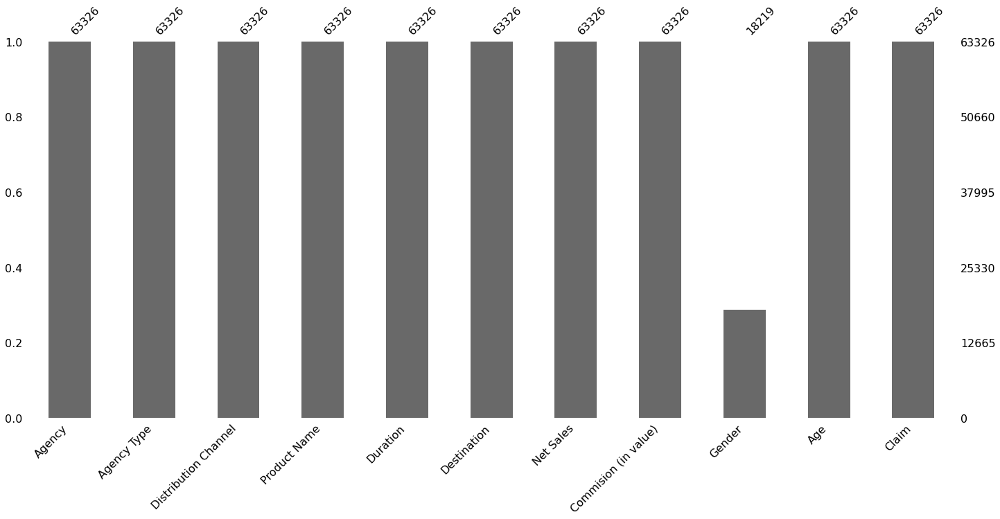

In [9]:
# Visualizing missing data in our dataframe.
mo.bar(df) 

Text(0, 0.5, 'Amount')

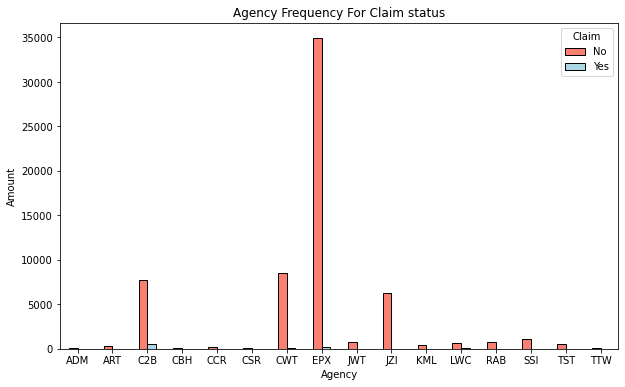

In [10]:
# let's visualze "Agency" vs "Claim"
pd.crosstab(df.Agency, df.Claim).plot(kind = "bar", figsize = (10,6), color = ["salmon","lightblue","lightgreen"],rot=0,ec="black")

plt.title("Agency Frequency For Claim status")
plt.ylabel("Amount")

Text(0, 0.5, 'Amount')

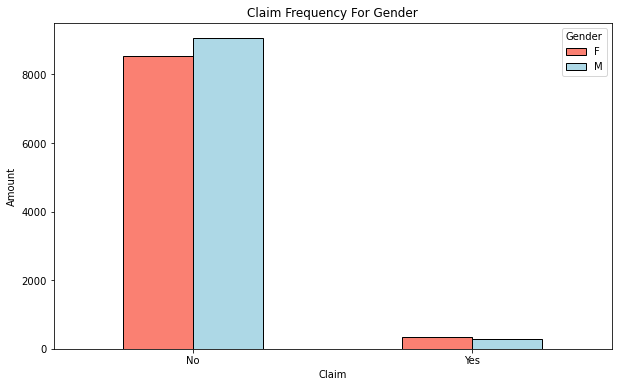

In [11]:
# visualization of "Claim" vs "Gender"
pd.crosstab(df.Claim, df.Gender).plot(kind = "bar", figsize = (10,6), color = ["salmon","lightblue","lightgreen"],rot=0,ec="black")

plt.title("Claim Frequency For Gender")
plt.ylabel("Amount")

Text(0, 0.5, 'Amount')

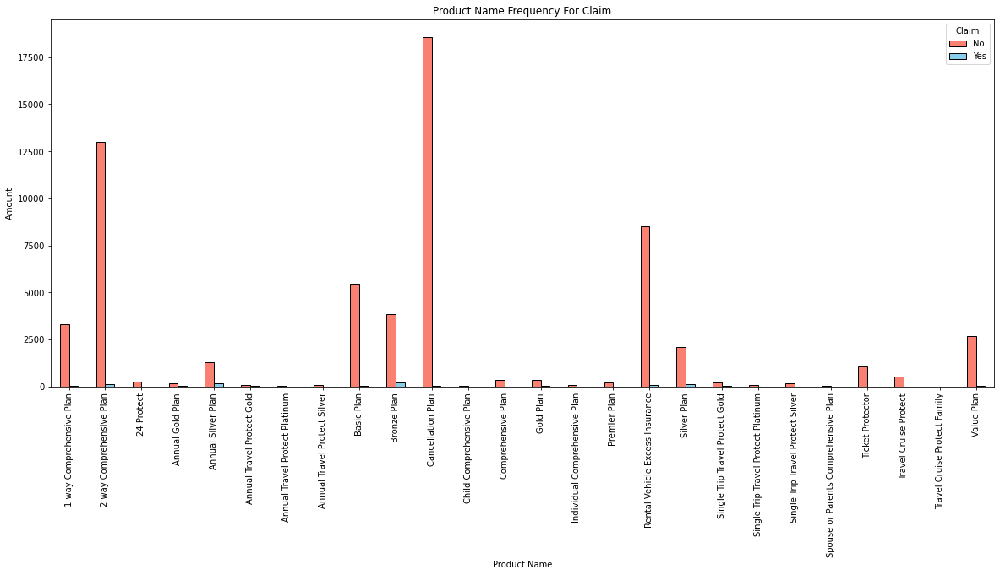

In [12]:
# Visualzation of "Product Name" vs "Claim"
pd.crosstab( df['Product Name'],df.Claim).plot(kind = "bar", figsize = (20,8), color = ["salmon","skyblue"],rot=90,ec="black")

plt.title("Product Name Frequency For Claim")
plt.ylabel("Amount")

In [13]:
list_countries = df['Destination'].unique().tolist()
# print(list_countries) # Uncomment to see list of countries
d_country_code = {}  # To hold the country names and their ISO
for country in list_countries:
    try:
        country_data = pycountry.countries.search_fuzzy(country)
        # country_data is a list of objects of class pycountry.db.Country
        # The first item  ie at index 0 of list is best fit
        # object of class Country have an alpha_3 attribute
        country_code = country_data[0].alpha_3
        d_country_code.update({country: country_code})
    except:
        print('could not add ISO 3 code for ->', country)
        # If could not find country, make ISO code ' '
        d_country_code.update({country: ' '})

# print(d_country_code) # Uncomment to check dictionary  

# create a new column iso_alpha in the df
# and fill it with appropriate iso 3 code
for k, v in d_country_code.items():
    df.loc[(df.Destination == k), 'iso_alpha'] = v

# print(df.head)  # Uncomment to confirm that ISO codes added
fig = px.choropleth(data_frame = df,
                    locations= "iso_alpha",
                    color= "Agency",  # value in column 'Confirmed' determines color
                    hover_name= "Destination",
                    color_continuous_scale= 'RdYlGn',  #  color scale red, yellow green
                    animation_frame= "Claim")

fig.show()

could not add ISO 3 code for -> MACEDONIA, THE FORMER YUGOSLAV REPUBLIC OF
could not add ISO 3 code for -> LIBYAN ARAB JAMAHIRIYA
could not add ISO 3 code for -> TIBET
could not add ISO 3 code for -> REPUBLIC OF MONTENEGRO
